In [1]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
import torch
from IPython.display import display

from maskterial import MaskTerial, load_models
from maskterial.structures import Flake

/mnt/data/mis2025/group_6/anaconda3/envs/maskterial/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
def display_results(
    image: np.ndarray,
    flakes: list[Flake],
    colors: list[tuple[int, int, int]] = [
        (255, 0, 0),
        (0, 0, 255),
        (0, 255, 0),
        (0, 255, 255),
        (255, 0, 255),
        (255, 41, 255),
    ],
):
    for flake in flakes:
        mask = flake.mask.astype(np.uint8)
        class_id = int(flake.thickness)

        # Draw outline
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(image, contours, -1, colors[class_id], 2)

        # Get bounding box
        x, y, w, h = cv2.boundingRect(mask)

        # Draw bounding box
        cv2.rectangle(image, (x, y), (x + w, y + h), colors[class_id], 2)

        # Add class label
        label = f"Class {class_id}"
        font = cv2.FONT_HERSHEY_SIMPLEX
        font_scale = 0.6
        thickness = 2

        # Get text size for background
        (text_width, text_height), baseline = cv2.getTextSize(
            label, font, font_scale, thickness
        )

        # Adjust text position to keep it within bounds
        text_y = y - 5 if y - text_height - 10 >= 0 else y + h + text_height + 5
        bg_y1 = text_y - text_height - 5 if y - text_height - 10 >= 0 else y + h
        bg_y2 = text_y + 5 if y - text_height - 10 >= 0 else y + h + text_height + 10

        # Draw background rectangle for text
        cv2.rectangle(image, (x, bg_y1), (x + text_width, bg_y2), colors[class_id], -1)

        # Draw text
        cv2.putText(
            image, label, (x, text_y), font, font_scale, (255, 255, 255), thickness
        )

    fig, axis = plt.subplots(1, 1, figsize=(12, 12), dpi=100)
    plt.imshow(image[:, :, ::-1])
    plt.axis("off")
    plt.show()

In [3]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

IMAGE_DIR = "/mnt/data/mis2025/group_6/Data/hBN/test"

SEG_MODEL = "M2F"
SEG_MODEL_ROOT = "/mnt/data/mis2025/group_6/Parameter/trained_para/second_roll"

CLS_MODEL = "AMM"
CLS_MODEL_ROOT = "/mnt/data/mis2025/group_6/Parameter/trained_para/amm_para/first_roll"

PP_MODEL = None
PP_MODEL_ROOT = None

SCORE_THRESHOLD = 0.1
MIN_CLASS_OCCUPANCY = 0.5
SIZE_THRESHOLD = 200

In [4]:
segmentation_model, classification_model, postprocessing_model = load_models(
    seg_model_type=SEG_MODEL,
    seg_model_root=SEG_MODEL_ROOT,
    cls_model_type=CLS_MODEL,
    cls_model_root=CLS_MODEL_ROOT,
    pp_model_type=PP_MODEL,
    pp_model_root=PP_MODEL_ROOT,
    device=DEVICE,
)

predictor = MaskTerial(
    segmentation_model=segmentation_model,
    classification_model=classification_model,
    postprocessing_model=postprocessing_model,
    score_threshold=SCORE_THRESHOLD,
    min_class_occupancy=MIN_CLASS_OCCUPANCY,
    size_threshold=SIZE_THRESHOLD,
    device=DEVICE,
)

Processing 20240403-46_bmp_jpg.rf.fd8b43a3cd855ac3d4871f6bee9fdd2b.jpg (1/20)
Detected 1 flake(s).


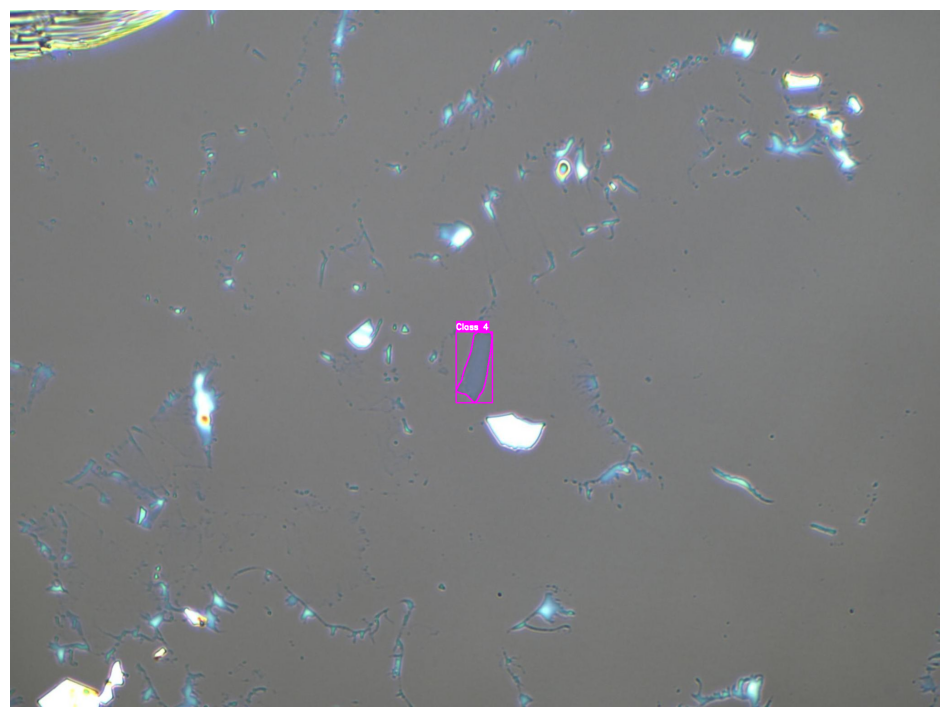

Processing C2-04_bmp_jpg.rf.a761d2822781bc343485144efbc3b93b.jpg (2/20)
Detected 9 flake(s).


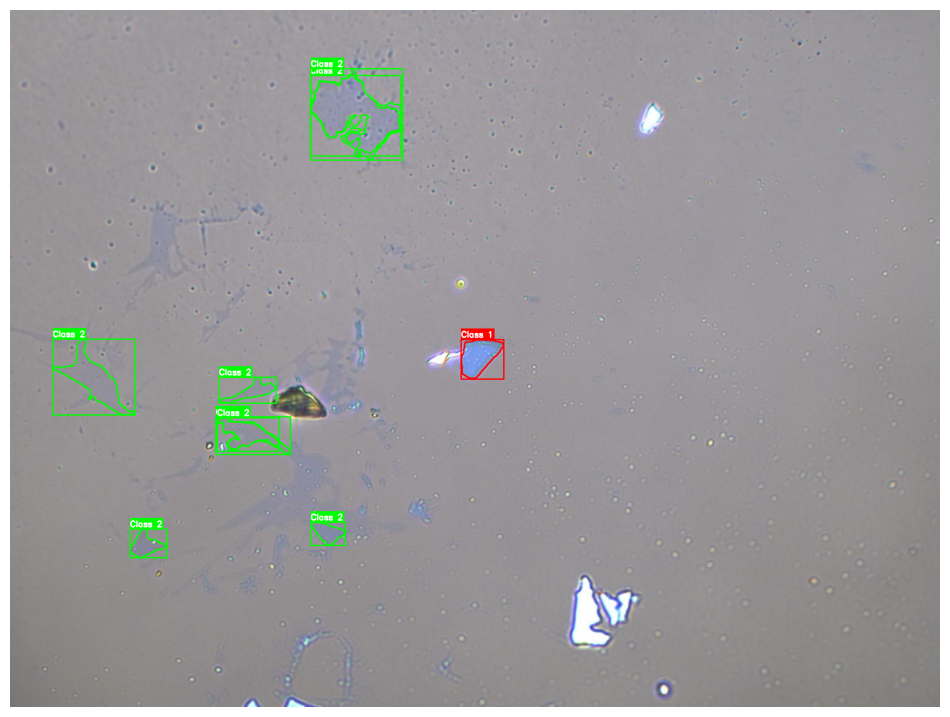

Processing 20240419-05_bmp_jpg.rf.5fa47e5269ad8b2972434026fb3bbead.jpg (3/20)
Detected 6 flake(s).


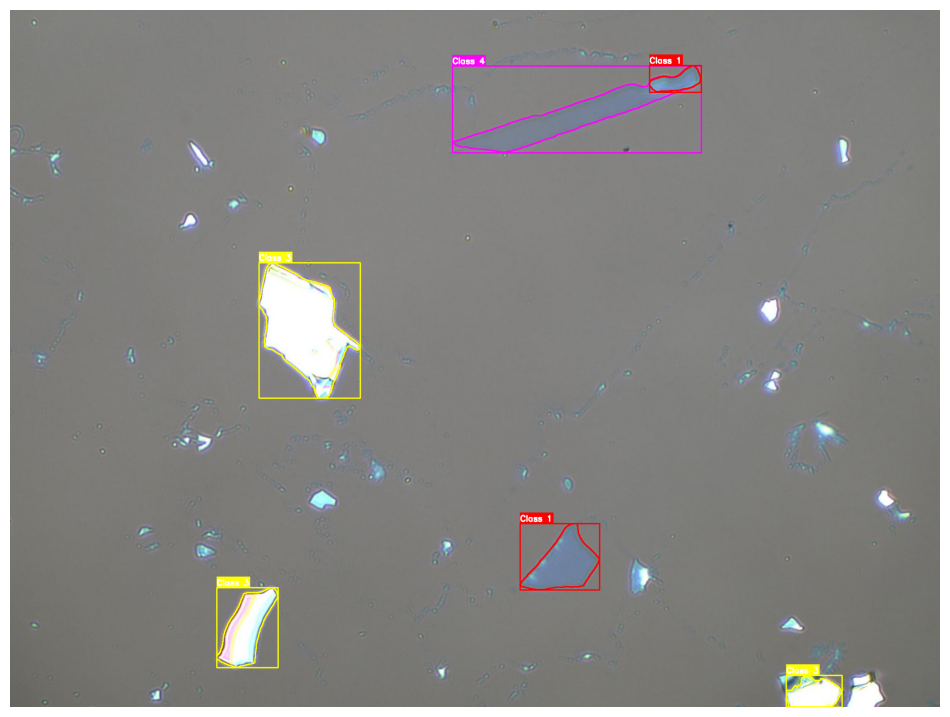

Processing 20240403-23_bmp_jpg.rf.68722617ed38f48af2e6e115d102c0ce.jpg (4/20)
Detected 5 flake(s).


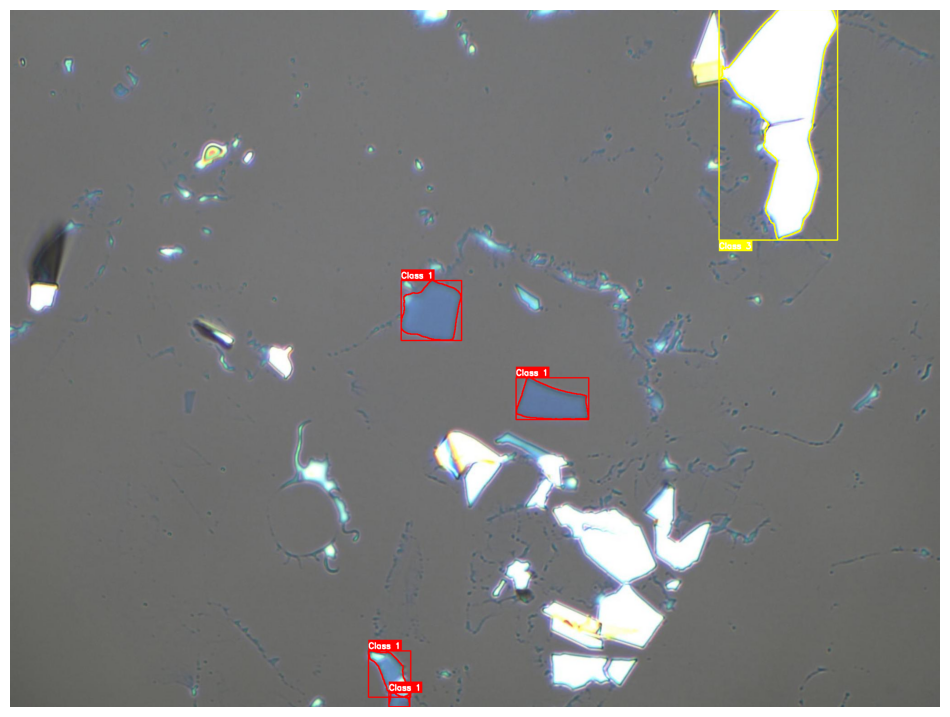

Processing 20240419-20_bmp_jpg.rf.387ec4afda2e921f9acd272d42a0f6cf.jpg (5/20)
Detected 7 flake(s).


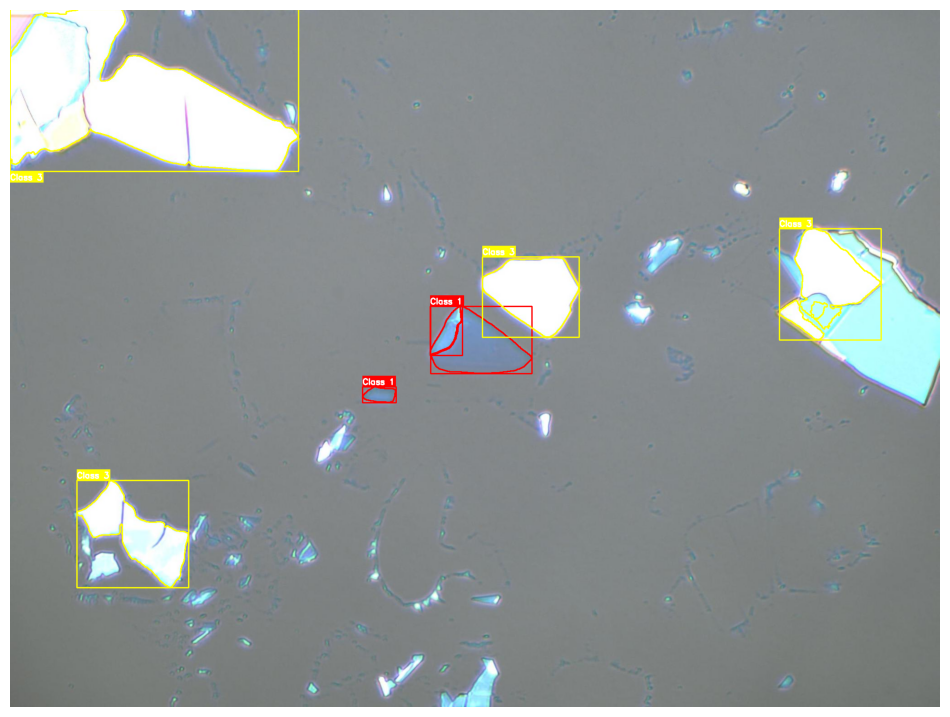

Processing 20240403-35_bmp_jpg.rf.14df2f2f572ac7744a24dca3cae9c165.jpg (6/20)
Detected 5 flake(s).


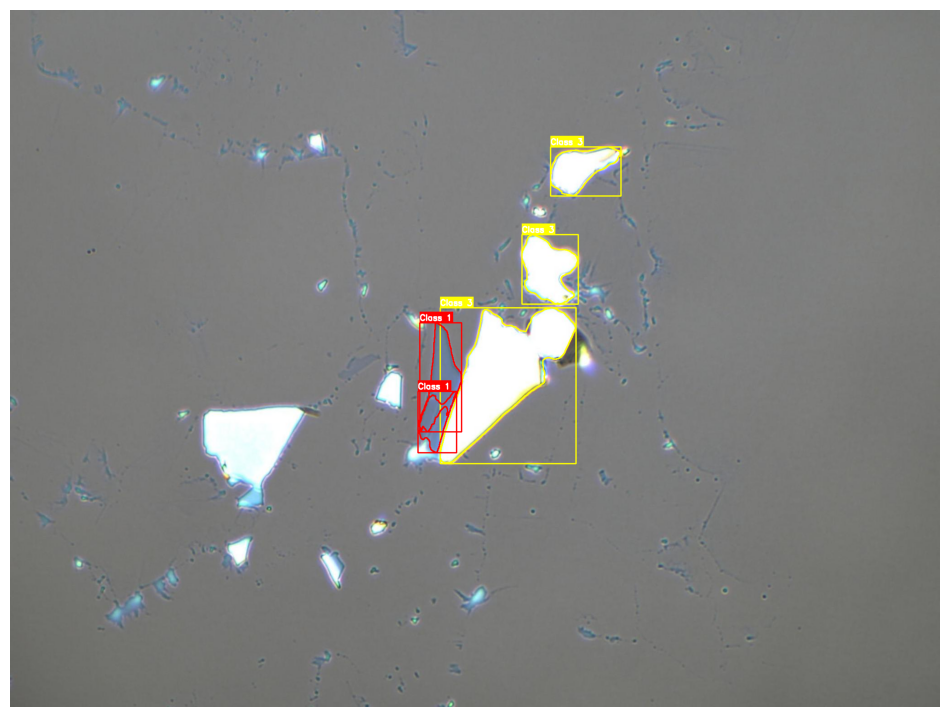

Processing 20240419-09_bmp_jpg.rf.877173776cd84a8a1ba0af9336292e87.jpg (7/20)
Detected 5 flake(s).


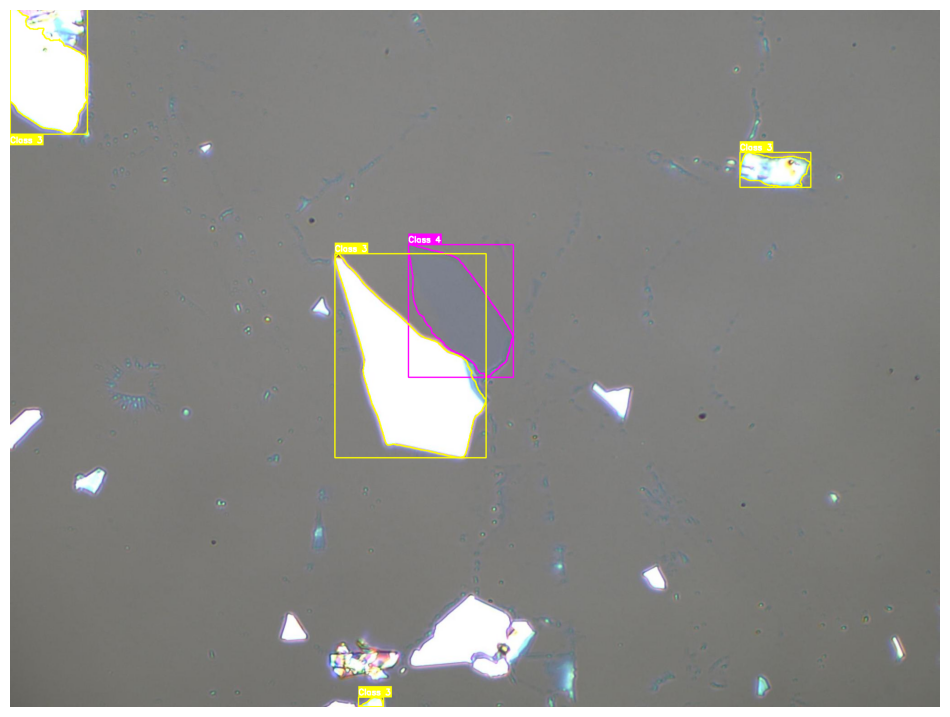

Processing C2-09_bmp_jpg.rf.e721a823c020133c5cdaee077e20a300.jpg (8/20)
Detected 12 flake(s).


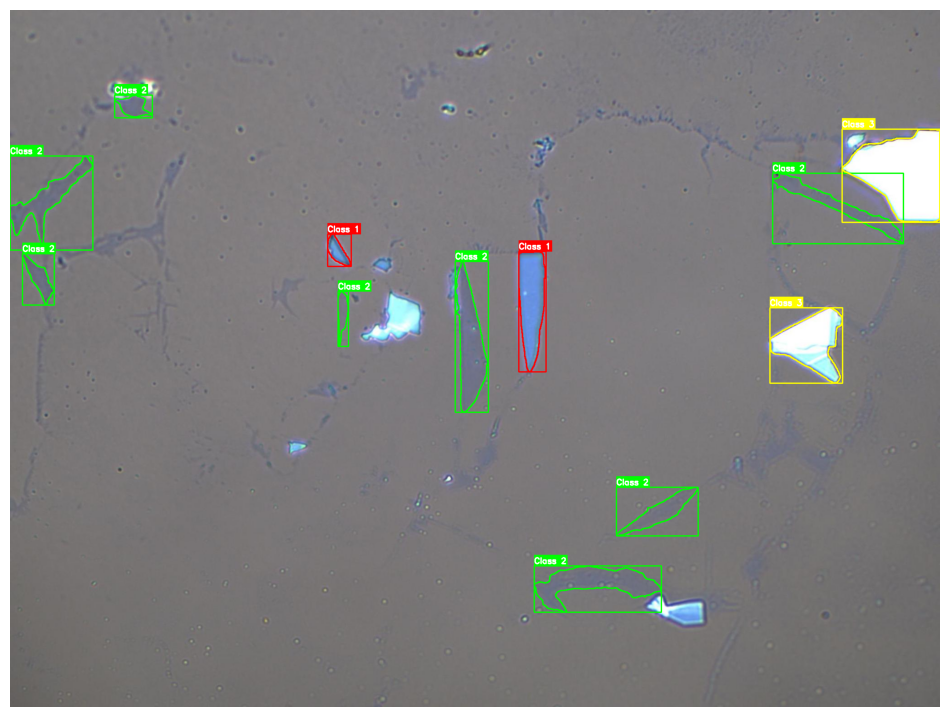

Processing 20240522-5_bmp.rf.55eaca15701d8a2cc1352899f6968893.jpg (9/20)
Detected 11 flake(s).


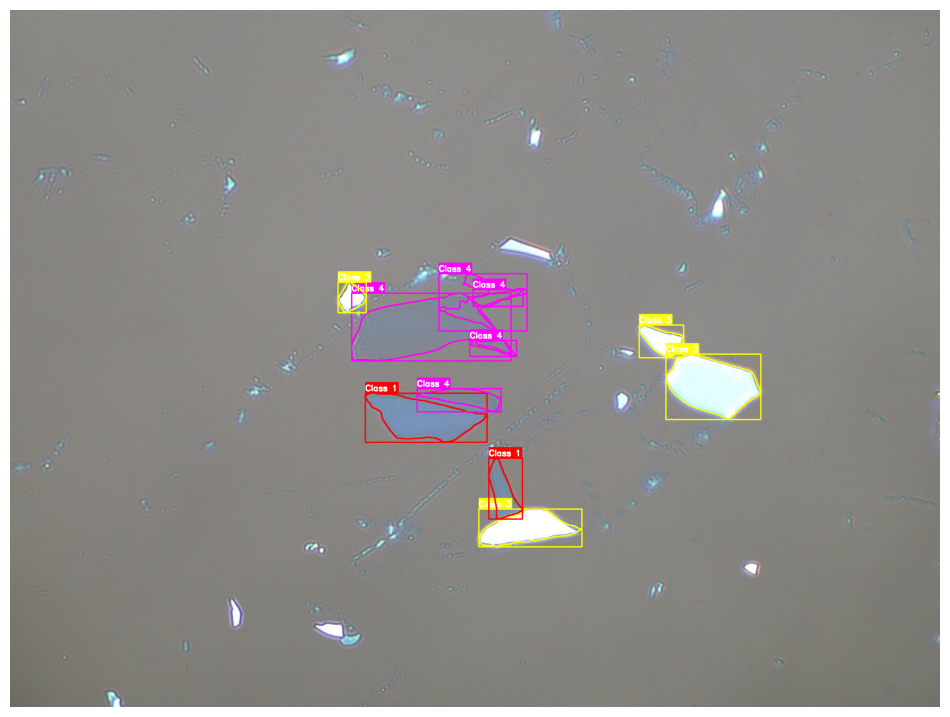

Processing 20240403-06_bmp_jpg.rf.5bc30613672211d2227c28708b49270c.jpg (10/20)
Detected 2 flake(s).


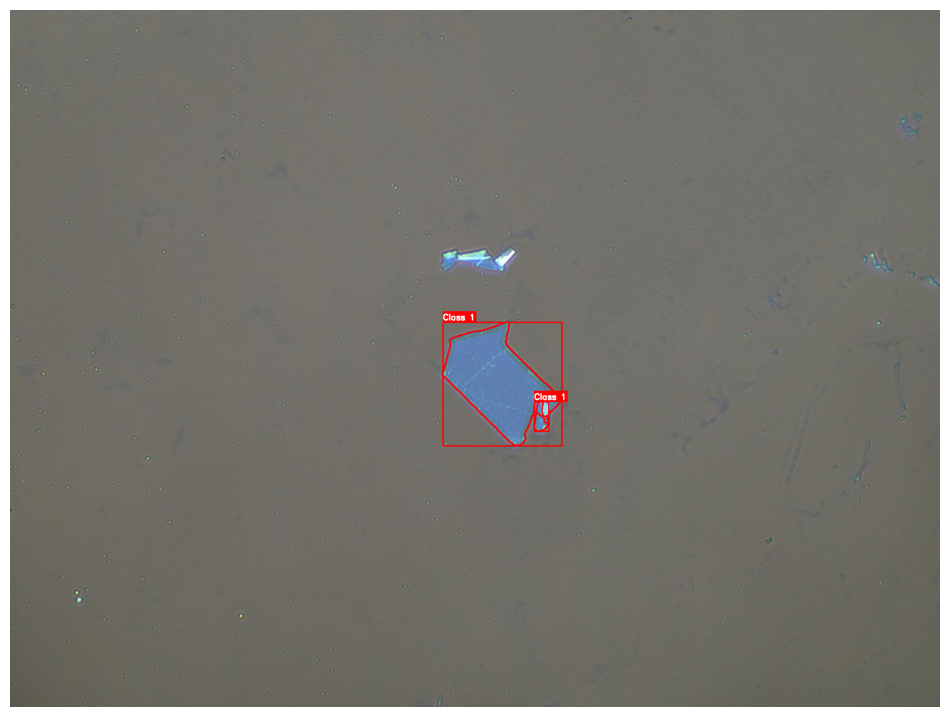

Processing C2-05_bmp_jpg.rf.24ed147ed88d383bdda153b54506ff23.jpg (11/20)
Detected 4 flake(s).


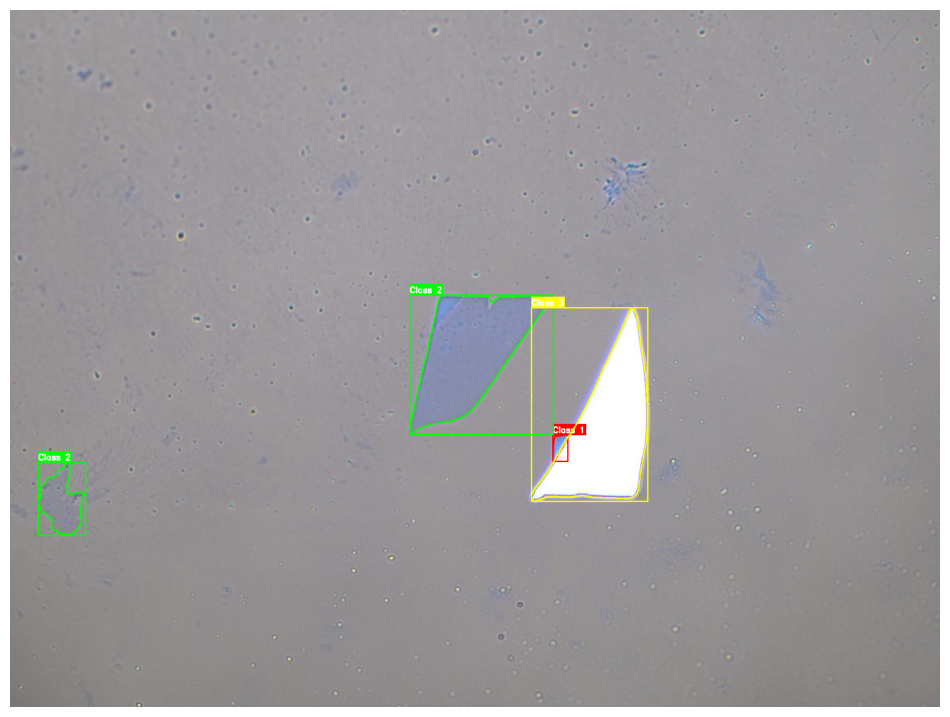

Processing 12-C2___bmp_jpg.rf.56174e683b83e219110d24d129449888.jpg (12/20)
Detected 4 flake(s).


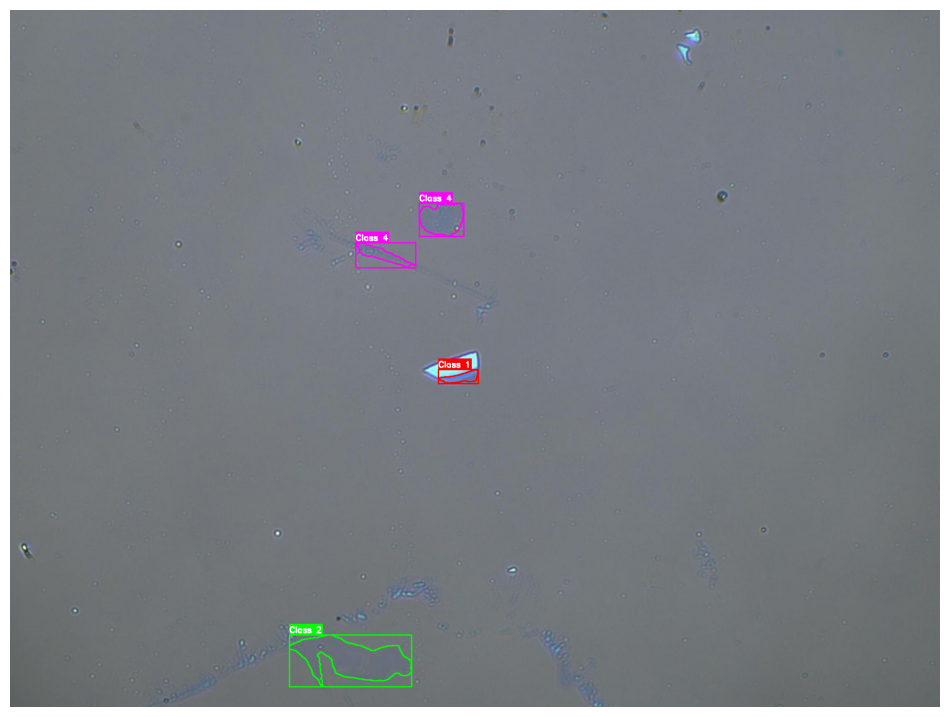

Processing 20240410-12_bmp_jpg.rf.b32a8c0ca9e7df3ee75e63a45767042e.jpg (13/20)
Detected 5 flake(s).


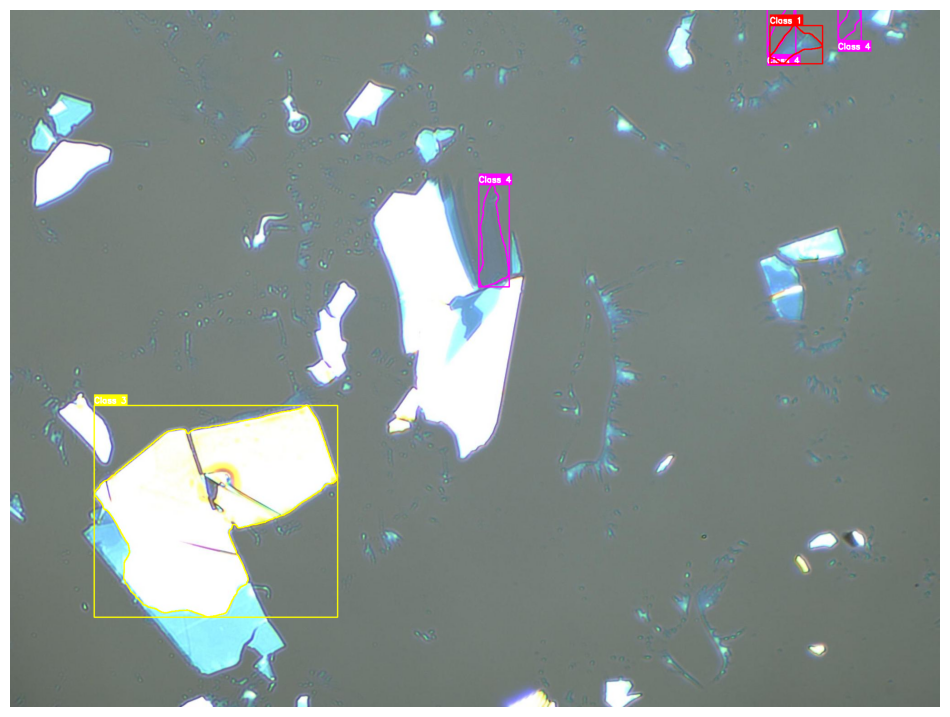

Processing 20240403-36_bmp_jpg.rf.6d950f801ac93cff434c55a74ad95747.jpg (14/20)
Detected 4 flake(s).


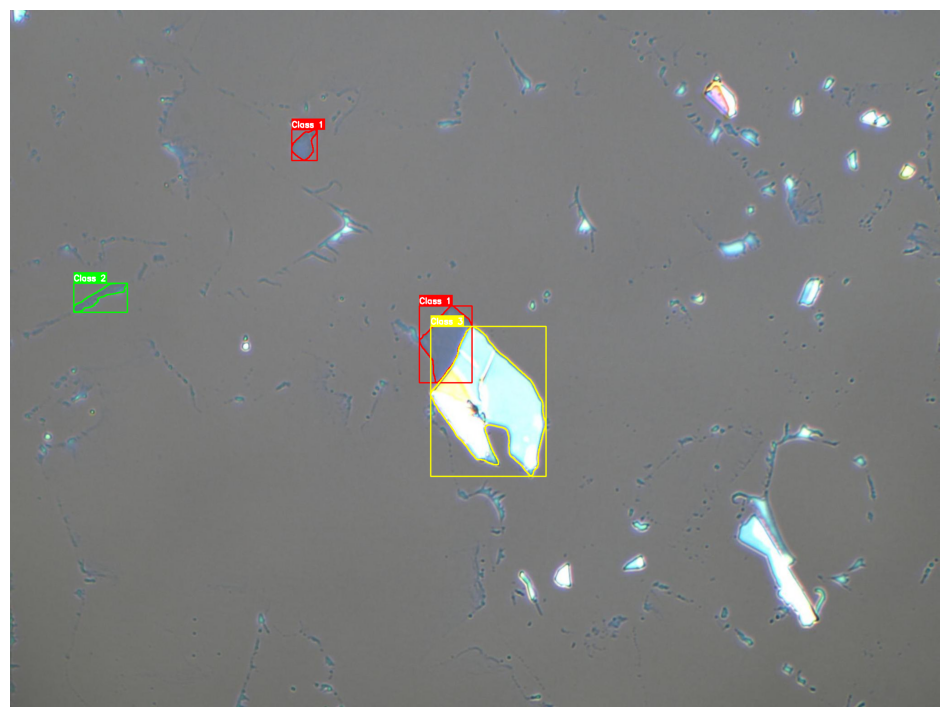

Processing 20240403-14_bmp_jpg.rf.ef672bb2c33e6e3158e2f4b2c57ee3b8.jpg (15/20)
Detected 5 flake(s).


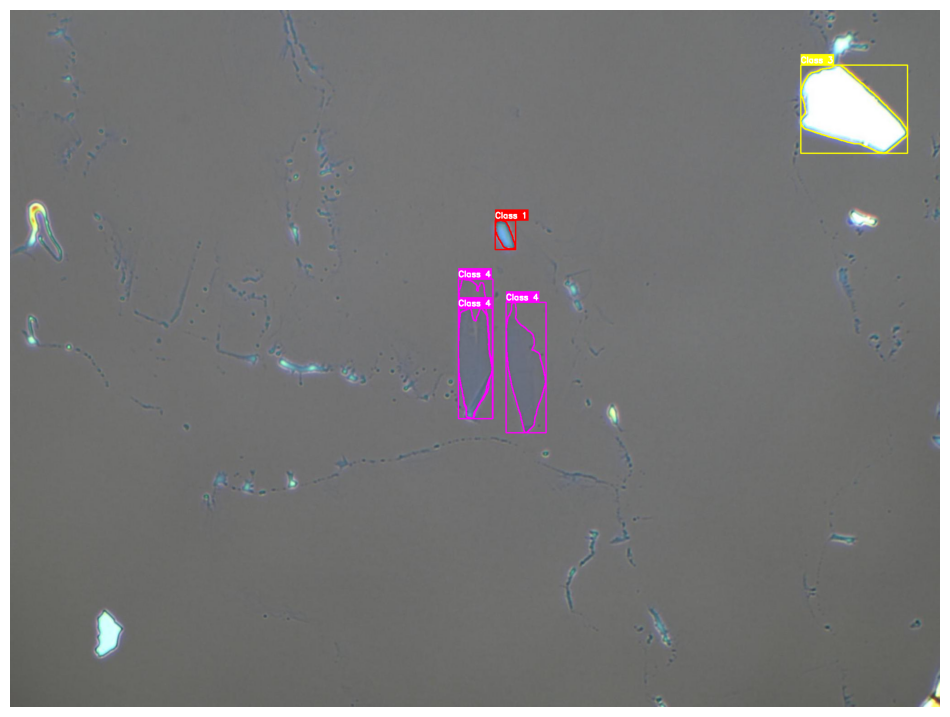

Processing C2_-10_bmp_jpg.rf.f25cafbd3beb7bb88a5260c0a242c772.jpg (16/20)
Detected 6 flake(s).


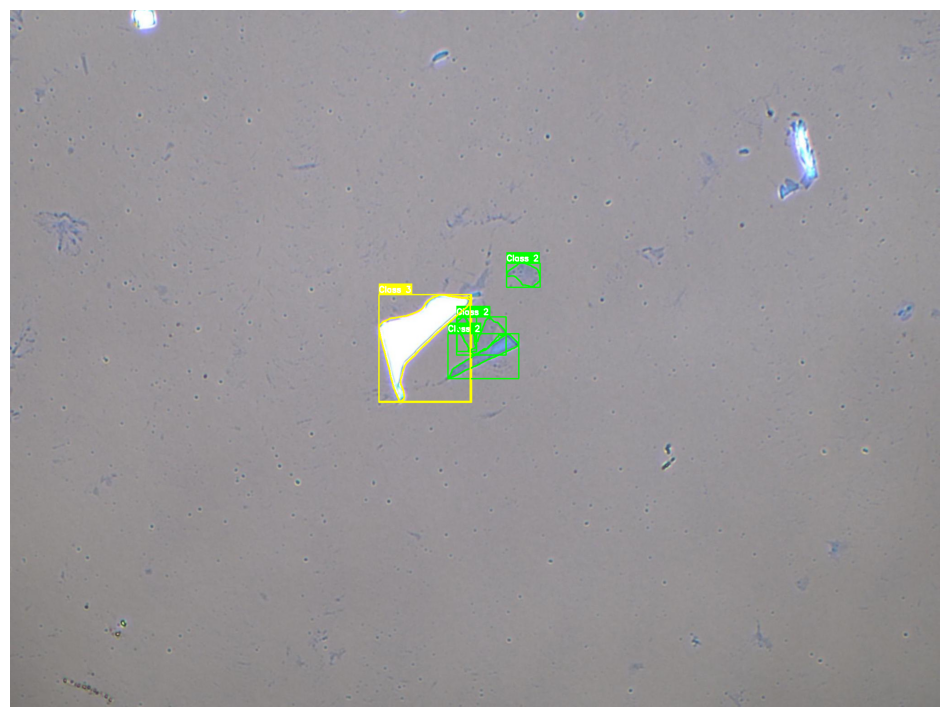

Processing 20240522-7_bmp.rf.a3fc0d8e73ac18c3e5c5586779f075ce.jpg (17/20)
Detected 3 flake(s).


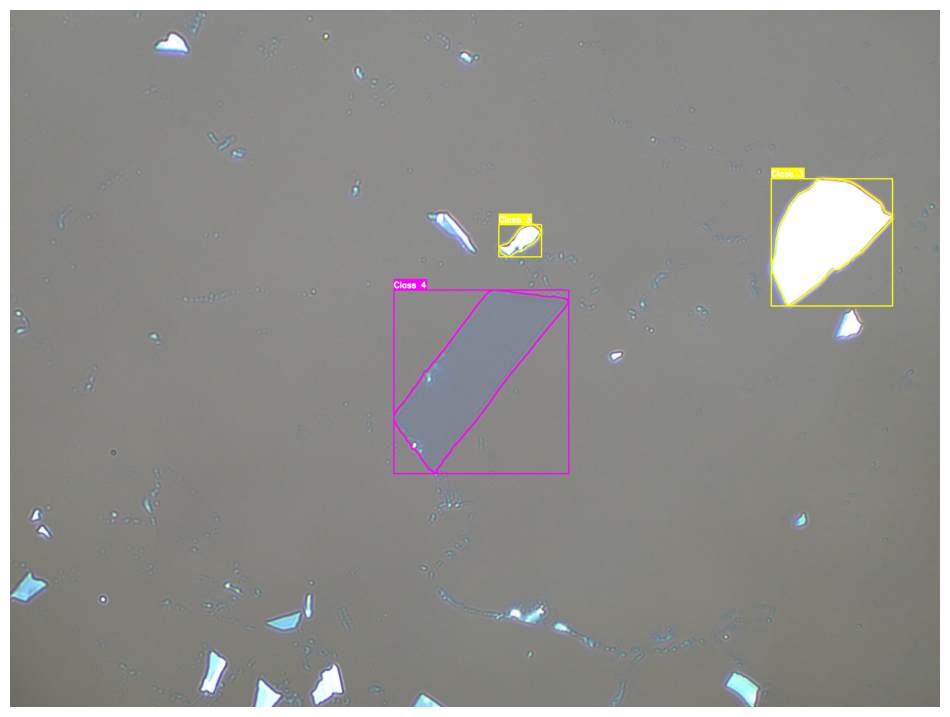

Processing 20240410-19_bmp_jpg.rf.53fa907f0313a3b4de24868e4eba10e1.jpg (18/20)
Detected 4 flake(s).


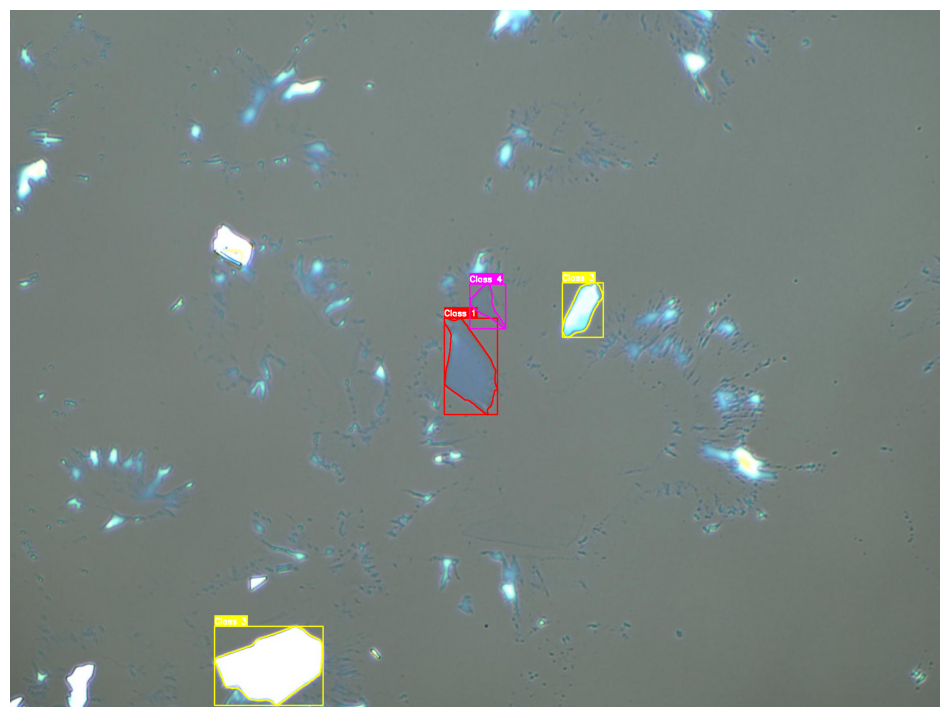

Processing 20240403-31_bmp_jpg.rf.e216599b5ab6d15cd090b98280418731.jpg (19/20)
Detected 4 flake(s).


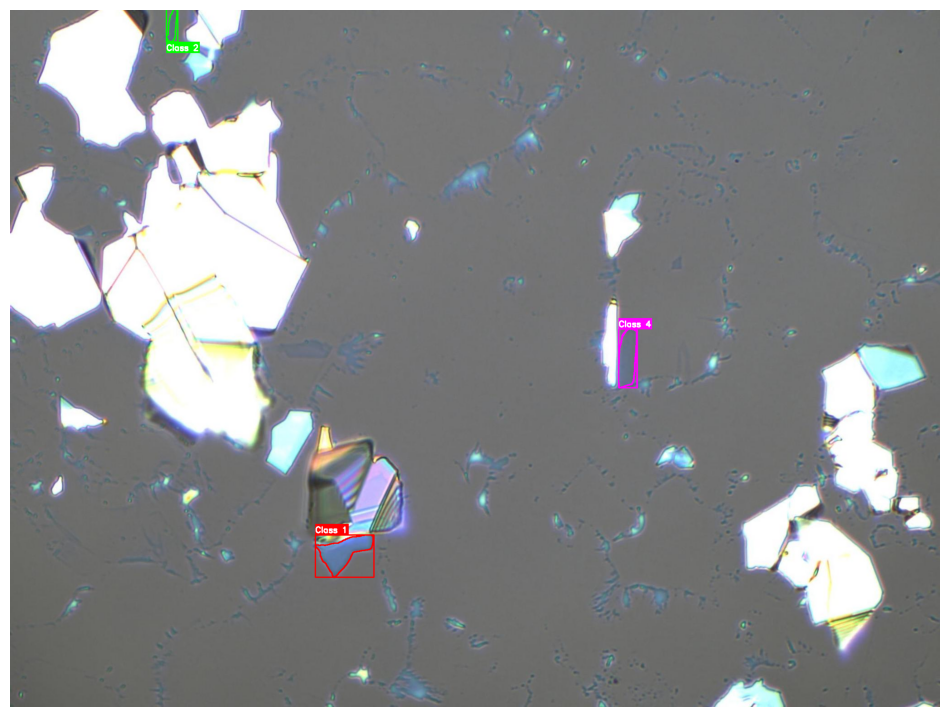

Processing int2-50x_png.rf.deff5934323649d2b7fb2ddcde59f657.jpg (20/20)
Detected 1 flake(s).


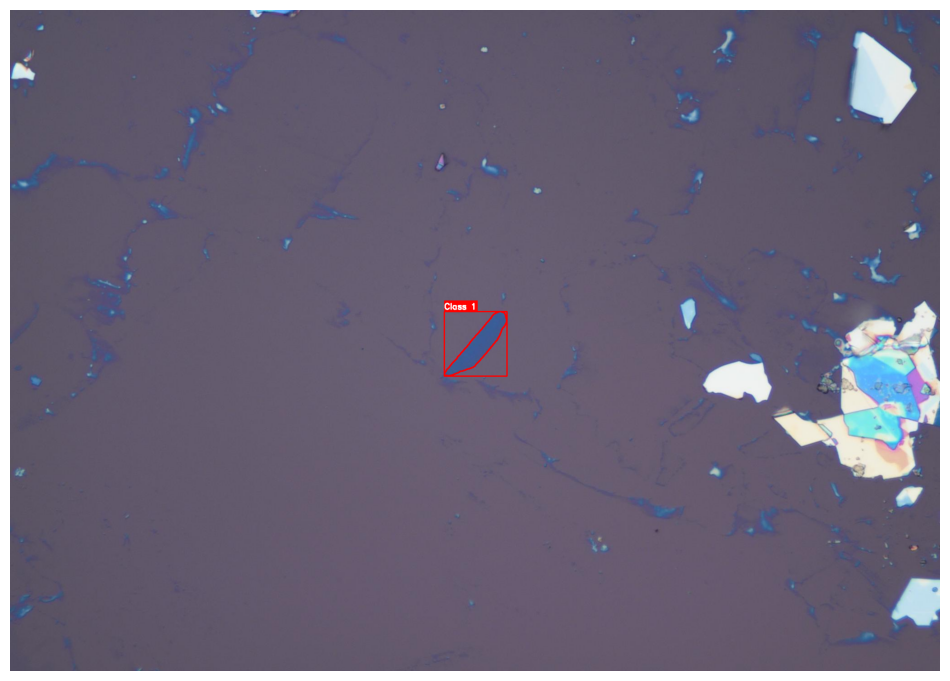

In [5]:
image_names = [
    file for file in os.listdir(IMAGE_DIR) if file.endswith((".jpg", ".png", ".jpeg"))
][15:35] # We only show the first 5, you can show more

for index, image_name in enumerate(image_names):
    print(f"Processing {image_name} ({index + 1}/{len(image_names)})")

    image_path = os.path.join(IMAGE_DIR, image_name)
    image = cv2.imread(image_path)
    flakes = predictor.predict(image)

    if len(flakes) == 0:
        print("No flakes detected, skipping...")
        continue
    print(f"Detected {len(flakes)} flake(s).")

    display_results(image, flakes)